## Load

In [1]:
import os
default_n_threads = 8
os.environ['OPENBLAS_NUM_THREADS'] = f"{default_n_threads}"
os.environ['MKL_NUM_THREADS'] = f"{default_n_threads}"
os.environ['OMP_NUM_THREADS'] = f"{default_n_threads}"
import glob
import numpy as np
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans

In [2]:
%load_ext autoreload
%autoreload 2
%pylab inline
%matplotlib inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [3]:
import warnings
import logging
warnings.filterwarnings("ignore")
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

from glob import iglob

import numpy as np
import pandas as pd
from anndata import AnnData
from scipy.sparse import diags
from scipy.io import mmwrite
from scipy import sparse
from scipy.optimize import fsolve,minimize
from tqdm import tqdm
from pathlib import Path
from typing import Union, Optional
import pickle
import seaborn as sns

#from SCCAF import *

from scipy.sparse import csr_matrix

#from scDenorm.denorm import *

#from scAnnot.tools import *

import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.font_manager as fm
font_path = '/data2st1/junyi/arial.ttf' 
fm.fontManager.addfont(font_path)

import matplotlib as mpl
#sc.set_figure_params(scanpy=True, fontsize=14,facecolor=None,frameon=False,transparent=True)
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.grid'] = False

mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['ps.fonttype']=42

mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['font.sans-serif'] = "Arial"

In [4]:
# ad=sc.read('/data2st2/junyi/output/csds0819/SN_CSDSWT_RESMB_before_int.h5ad')

# ad_full = sc.read('/data2st1/junyi/CUMS_CSDS_RES.h5ad')
# ad_full.X.max()
# mean_expression = np.array(ad_full.X.mean(axis=0)).flatten()

# # Create a dataframe for clarity
# gene_expression_df = pd.DataFrame({
#     'gene': ad_full.var_names,
#     'mean_expression': mean_expression
# })

# # if isinstance(norm_dict["X"], CSBase):
# #     mean_percent = norm_dict["X"].mean(axis=0).A1
# #     top_idx = np.argsort(mean_percent)[::-1][:n_top]
# #     counts_top_genes = norm_dict["X"][:, top_idx].toarray()
# # else:
# #     mean_percent = norm_dict["X"].mean(axis=0)
# #     top_idx = np.argsort(mean_percent)[::-1][:n_top]
# #     counts_top_genes = norm_dict["X"][:, top_idx]
# # columns = (
# #     adata.var_names[top_idx]
# #     if gene_symbols is None
# #     else adata.var[gene_symbols].iloc[top_idx].astype("string")
# # )
# # counts_top_genes = pd.DataFrame(
# #     counts_top_genes, index=adata.obs_names, columns=columns
# # )

# sc.pl.highest_expr_genes(ad_full, n_top=20)

# len(ad.obs['sample'].unique())
# len(ad_full.obs['sample'].unique())
# ad_full.obs
# ad.obs.groupby(['group','status']).nunique()
# ad_full.obs.groupby(['group','status']).nunique()
# # concat ad and ad_full
# ad_all = ad.concatenate(ad_full)
# ad_all.write_h5ad('/data2st2/junyi/output/SN_CSDSWT_RESMB_before_int_concat_full.h5ad')

In [5]:
ad_all = sc.read('/data2st1/junyi/final.h5ad')

In [6]:
ad_all.obs

,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,...,conf_score,celltype.L2_old,celltype.L1_old,Neurotransmitter_celltype_old,Neurotransmitter_celltype,celltype.L1,celltype.L2,predict.subclass,umap_seurat_1,umap_seurat_2
AAACCCAAGCTTGTTG-1PFC_beirui_FC63E,FC63E_PFC_beirui,4453,8.401558,16167.0,9.690789,30.259170,37.551803,46.180491,59.473001,7.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L5 IT Glut,005 L5 IT CTX Glut,-8.439108,-5.629186
AAACCCAAGTATGATG-1PFC_beirui_FC63E,FC63E_PFC_beirui,3150,8.055475,8260.0,9.019301,28.704600,35.786925,44.443099,58.716707,16.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L4/5 IT Glut,006 L4/5 IT CTX Glut,-8.133489,-0.168780
AAACCCACAACCCTAA-1PFC_beirui_FC63E,FC63E_PFC_beirui,2836,7.950502,7621.0,8.938794,33.105892,39.837292,47.841491,61.592967,5.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L2/3 IT Glut,007 L2/3 IT CTX Glut,-3.175797,8.722422
AAACCCACACATACGT-1PFC_beirui_FC63E,FC63E_PFC_beirui,5370,8.588769,21106.0,9.957360,30.299441,37.060552,44.868758,57.130674,12.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L2/3 IT Glut,007 L2/3 IT CTX Glut,-3.936474,7.770447
AAACCCACATCGATGT-1PFC_beirui_FC63E,FC63E_PFC_beirui,1715,7.447751,3077.0,8.032036,25.901852,32.694183,42.508937,60.513487,6.0,...,0.999718,NaN,NaN,NaN,NN,Oligo,MOL-3,NN,-1.848519,-2.865366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGAAGCTG-1PFC_beirui_WT2-1,WT2-1_PFC_beirui,1286,7.160069,2278.0,7.731492,32.309043,39.552239,48.770852,65.496049,6.0,...,0.999999,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L5 NP Glut,032 L5 NP CTX Glut,-3.668649,-14.962312
TTTGTTGGTTCTCGCT-1PFC_beirui_WT2-1,WT2-1_PFC_beirui,1689,7.432484,3129.0,8.048788,29.658038,36.465324,45.765420,62.000639,6.0,...,0.995385,NaN,NaN,NaN,NN,OPC,OPC,NN,-11.525170,1.734139
TTTGTTGGTTGATCGT-1PFC_beirui_WT2-1,WT2-1_PFC_beirui,1913,7.556951,4227.0,8.349484,36.101254,42.583392,50.768867,65.909629,5.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L4/5 IT Glut,006 L4/5 IT CTX Glut,-3.777837,1.502074
TTTGTTGTCGACGCGT-1PFC_beirui_WT2-1,WT2-1_PFC_beirui,2207,7.699842,5148.0,8.546557,34.226884,41.472416,50.213675,63.811189,1.0,...,1.000000,NaN,NaN,NaN,Glutamatergic,Neuron,PFC L5 ET Glut,022 L5 ET CTX Glut,4.033217,-2.299693


In [7]:
# ad_csdsres = sc.read('/data2st2/junyi/output/csdsres1015/SN_CSDSRES_before_int.h5ad')

In [8]:
hkgene = ['Rpl13a', 'Rplp0', 'Rps18', 'Rps27a', 'Rps23', 'Rps29', 'Rpl32','Eef1a1', 'Eef2', 'Ppia', 'Hsp90ab1', 'Psma1','Cyc1', 'Ubb', 'Psmb2']

In [9]:
# select the gene expression of hkgene from ad_all
select_genes = ad_all[:, hkgene].X

In [10]:
ad_all.obsm['hkgene_expression'] = select_genes.toarray()

In [ ]:
# --- 测试 hkgene：groupby sample + 按 region 排序 + 脑区内 dendrogram ---
# 1) 确保 hkgene_expression 存在
hkgene_present = [g for g in hkgene if g in ad_all.var_names]
if 'hkgene_expression' not in ad_all.obsm_keys():
    ad_all.obsm['hkgene_expression'] = ad_all[:, hkgene_present].X.toarray()

# 2) 每个脑区内独立计算 dendrogram，获得 intra-region 样本排序
from collections import OrderedDict
from scipy.cluster.hierarchy import linkage as sp_linkage

region_data = OrderedDict()
sub_dict = {}
for reg in sorted(ad_all.obs['region'].unique()):
    print(f"Processing region: {reg}")
    sub = ad_all[ad_all.obs['region'] == reg]

In [42]:
# extract genes name start with Rps or Rpl
#top_genes = ad_all.var_names[top_idx]
rps_genes = [gene for gene in ad_all.var_names if gene.startswith('Rps')]
mt_genes = [gene for gene in ad_all.var_names if gene.startswith('mt-')]

In [ ]:
# --- 函数：复用 sub_dict 画出不同基因集的 dotplot（纵向拼接，统一色标）---
def dotplot_by_region(sub_dict, genes,
                      adata_full=None,
                      groupby='sample_status',
                      standard_scale='var',
                      figsize=(20, 70),
                      hspace=-0.1,
                      out_path='/data2st2/junyi/output/dotplot_by_region.pdf',
                      show=False,
                      max_genes=50):
    """
    利用 sub_dict（已按脑切分好的子集 dict）绘制各脑区 dotplot，纵向拼接。
    参数:
        sub_dict : dict, {region: ad_subset} 由上方完整 cell 计算产生
        genes    : list, 基因名列表
        adata_full : 若提供，用于检查基因是否存在于 var_names
        groupby  : dotplot 的 x 轴分组列
        standard_scale : 'var' 或 'group' 或 None
        height_per_region, fig_width, hspace : 布局参数
        out_path : pdf 保存路径
        show     : 是否 plt.show()
        max_genes : int, 单个图中最多基因数。有效基因数超过该值时自动分批绘制，
                    每批仍用相同 figsize，输出文件名追加 _part01/_part02 等后缀。
    返回:
        分批时返回 (list_of_figs, None)；否则返回 (fig, axes)
    """
    from collections import OrderedDict
    import matplotlib.pyplot as plt

    # 检查基因存在
    if adata_full is not None:
        genes_plot = [g for g in genes if g in adata_full.var_names]
    else:
        first_key = list(sub_dict.keys())[0]
        genes_plot = [g for g in genes if g in sub_dict[first_key].var_names]
    if len(genes_plot) < 2:
        raise ValueError(f"有效基因 {len(genes_plot)} 个，至少需 2 个")

    # ---- 有效基因数超过 max_genes 时：按 max_genes 个一批，递归分批绘制 ----
    if len(genes_plot) > max_genes:
        n_batches = int(np.ceil(len(genes_plot) / max_genes))
        print(f"有效基因 {len(genes_plot)} 个 > {max_genes}，分 {n_batches} 批绘制")
        figs = []
        for b in range(n_batches):
            batch_genes = genes_plot[b * max_genes:(b + 1) * max_genes]
            stem, ext = os.path.splitext(out_path)
            batch_out = f"{stem}_part{b + 1:02d}{ext}"
            fig, _ = dotplot_by_region(
                sub_dict, batch_genes, adata_full=adata_full,
                groupby=groupby, standard_scale=standard_scale,
                figsize=figsize, hspace=hspace,
                out_path=batch_out, show=show, max_genes=max_genes)
            figs.append(fig)
        return figs, None

    regions_sorted = sorted(sub_dict.keys())
    n = len(regions_sorted)

    vmin_g, vmax_g = 0, 1
    print(f"全局 vmin={vmin_g:.4f}, vmax={vmax_g:.4f}")

    fig, axes = plt.subplots(n, 1, figsize=figsize,
                             squeeze=False)

    for i, reg in enumerate(regions_sorted):
        ax = axes[i][0]
        sub = sub_dict[reg]
        stusmap = {
            "CON": "CTRL",
            "RES": "CURES",
            "SUS": "CUSUS",
            "CSDS":"CSSUS",
            "CSRES": "CSRES"

        }
        sub.obs['sample_status'] = sub.obs['sample'].astype(str) + '_' + sub.obs['status'].astype(str).map(stusmap)
        sub.obs['sample_status'] = sub.obs['sample_status'].astype('category')
        sc.tl.dendrogram(sub, groupby=groupby)
        sc.pl.dotplot(sub, var_names=genes_plot, groupby=groupby,
                      standard_scale=standard_scale, dendrogram=True,
                      vmin=vmin_g, vmax=vmax_g, show=False, ax=ax)

    # 仅保留最后一个子图的 x 轴和图例
    last_row_y0 = axes[-1][0].get_position().bounds[1]
    main_bbox = axes[0][0].get_position().bounds
    main_x1 = main_bbox[0] + main_bbox[2]
    for a in fig.axes:
        bbox = a.get_position().bounds
        if bbox[1] > last_row_y0 + 0.01:
            a.set_xticks([])
            a.set_xticklabels([])
            a.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
            a.xaxis.set_visible(False)
            a.spines['bottom'].set_visible(False)
            if bbox[0] > main_x1 - 0.01:
                a.set_visible(False)

    plt.subplots_adjust(hspace=hspace)
    plt.savefig(out_path,bbox_inches="tight")
    if show==True:
        plt.show()
    print(f"已保存 -> {out_path}")
    return fig, axes


# ---------- 对各基因集依次调用 dotplot_by_region ----------


In [ ]:
gene_sets = [
    ('hkgene',   hkgene_present),
    ('rps',  rps_genes),
    ('mt',       mt_genes)
]
for name, genes in gene_sets:
    print(f"\n===== {name} =====")
    dotplot_by_region(sub_dict, genes, adata_full=ad_all,
                      groupby='sample_status',
                      out_path=f'/data2st2/junyi/code/sn/figures/dotplot_{name}_per_region.pdf')

In [56]:
df_genegroup = pd.read_excel('/data2st2/junyi/code/sn/data/All_degs_N_v0715FF.xlsx')

全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM1-1_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM1-2_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM1-3_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM2-1_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM2-2_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM2-3_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM3-1_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM3-2_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM3-3_per_region.pdf
全局 vmin=0.0000, vmax=1.0000
已保存 -> /data2st2/junyi/code/sn/figures/dotplot_DML2_DM4-1_per_r

,DML2,n_genes_raw,n_genes_present
20,other,4083,4070
16,DM6-2,704,704
17,DM6-3,683,682
1,DM1-2,669,669
5,DM2-3,558,558
19,DM6-5,323,321
0,DM1-1,292,292
6,DM3-1,271,271
10,DM4-2,269,269
18,DM6-4,262,262


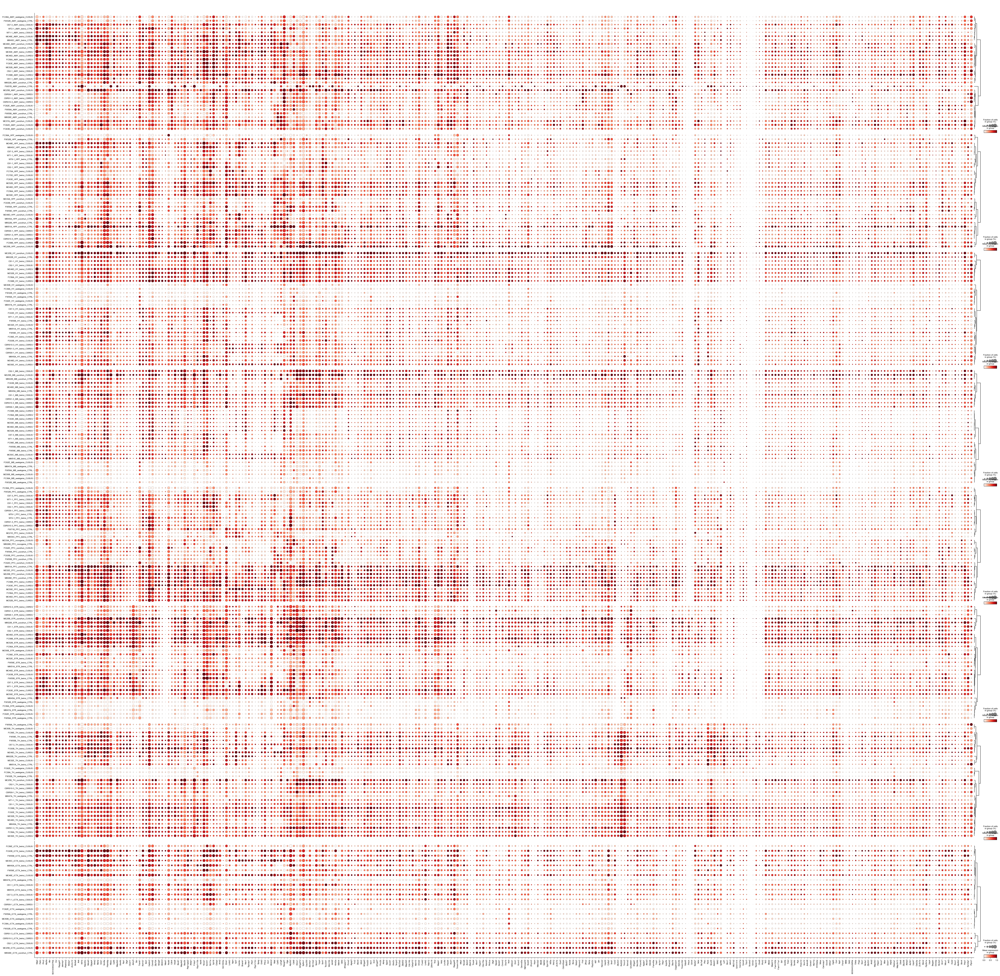

In [ ]:
# 按 df_genegroup 中每个 DML2 提取基因集，调用 dotplot_by_region 画图
import builtins

dml2_col = next((c for c in df_genegroup.columns if c.lower() == 'dml2'), None)
if dml2_col is None:
    raise ValueError("df_genegroup 中找不到 DML2 列")

gene_col_candidates = [
    c for c in df_genegroup.columns
    if c.lower() in {'gene', 'gene_symbol', 'genesymbol', 'symbol', 'gene_name', 'genename'}
]
if len(gene_col_candidates) > 0:
    gene_col = gene_col_candidates[0]
else:
    non_dml2_cols = [c for c in df_genegroup.columns if c != dml2_col]
    if len(non_dml2_cols) == 0:
        raise ValueError("df_genegroup 中没有可用的基因列")
    gene_col = non_dml2_cols[0]
    print(f"[Warning] 未识别标准基因列名，临时使用: {gene_col}")

if 'sample_group' not in ad_all.obs.columns:
    ad_all.obs['sample_group'] = ad_all.obs['sample'].astype(str) + '_' + ad_all.obs['status'].astype(str)
ad_all.obs['sample_group'] = ad_all.obs['sample_group'].astype('category')

if 'order' in globals():
    categories_order = order
else:
    categories_order = ad_all.obs['sample_group'].astype(str).drop_duplicates().tolist()

df_tmp = df_genegroup[[dml2_col, gene_col]].copy()
df_tmp = df_tmp.dropna(subset=[dml2_col, gene_col])
df_tmp[dml2_col] = df_tmp[dml2_col].astype(str).str.strip()
df_tmp[gene_col] = df_tmp[gene_col].astype(str).str.strip()

var_set = set(ad_all.var_names)
min_genes = 3

group_summary = []
for dml2_name, sub_df in df_tmp.groupby(dml2_col):
    raw_genes = pd.unique(sub_df[gene_col]).tolist()
    genes_present = [g for g in raw_genes if g in var_set]

    if len(genes_present) < min_genes:
        print(f"[Skip] {dml2_name}: 匹配到基因数 {len(genes_present)} < {min_genes}")
        continue

    safe_name = ''.join(ch if (ch.isalnum() or ch in ['_', '-']) else '_' for ch in dml2_name)

    # 改用 dotplot_by_region：按脑区分开画、纵向拼接、统一色标
    dotplot_by_region(sub_dict, genes_present, adata_full=ad_all,
                      groupby='sample_status',
                      figsize=(70, 70),
                      show=False,
                      out_path=f'/data2st2/junyi/code/sn/figures/dotplot_DML2_{safe_name}_per_region.pdf')

    group_summary.append({
        'DML2': dml2_name,
        'n_genes_raw': len(raw_genes),
        'n_genes_present': len(genes_present),
    })

df_dml2_summary = pd.DataFrame(group_summary).sort_values('n_genes_present', ascending=False)
print(f"完成 DML2 基因集处理: {len(df_dml2_summary)} 个分组")
df_dml2_summary